# Multivariate Interpolation on Structured Grids with SciPy

In this notebook we wil explore how to perform multivariate interpolation on structured grids using `scipy.interpolate`. In many engineering and scientific applications, we often have data sampled at regular intervals (e.g., from sensor arrays, imaging devices, or numerical simulations), and we need to estimate values at intermediate locations. This process is called interpolation.

We will compare three main functions from SciPy:
* `interpn`
* `RegularGridInterpolator`
* `RectBivariateSpline`.

To test these methods, we will use a well-known test function: the **peaks** function from MATLAB, which provides a visually interesting surface with a mix of sharp peaks and smooth valleys.

---

## 1. The Test Function: MATLAB's "Peaks"

First, let's define and visualize our test function. The "peaks" function is a combination of several Gaussian distributions, which makes it suitable for testing interpolation methods.

The function is defined as:

$$z(x, y) = 3(1-x)^2 e^{-x^2 - (y+1)^2} - 10\left(\frac{x}{5} - x^3 - y^5\right)e^{-x^2 - y^2} - \frac{1}{3}e^{-(x+1)^2 - y^2}$$

Let's implement this in Python and create our data. We will generate two grids:
1.  A **coarse grid** that will serve as our "sampled" data.
2.  A **fine grid** where we will interpolate the data and plot the results for comparison with the true function.

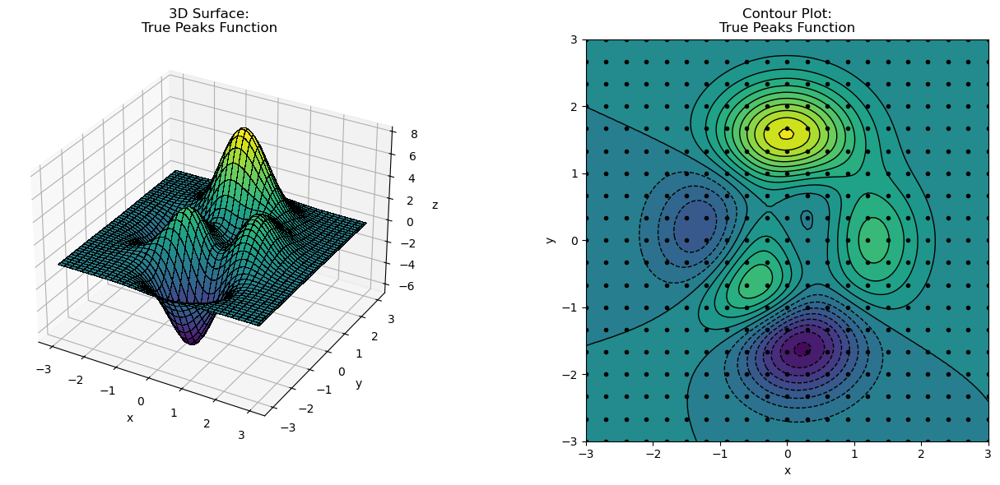

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interpn, RegularGridInterpolator, RectBivariateSpline

# Define the peaks function
def peaks(x, y):
    return 3*(1 - x)**2 * np.exp(-(x**2) - (y + 1)**2) \
           - 10*(x/5 - x**3 - y**5)*np.exp(-x**2 - y**2) \
           - np.exp(-(x + 1)**2 - y**2)/3

# Create the coarse grid (our "known" data)
x_coarse = np.linspace(-3, 3, 21)
y_coarse = np.linspace(-3, 3, 19)
xx_coarse, yy_coarse = np.meshgrid(x_coarse, y_coarse, indexing='ij')
z_coarse = peaks(xx_coarse, yy_coarse)

# Create the fine grid for interpolation and plotting the "true" surface
x_fine = np.linspace(-3, 3, 101)
y_fine = np.linspace(-3, 3,  99)
xx_fine, yy_fine = np.meshgrid(x_fine, y_fine, indexing='ij')
z_true = peaks(xx_fine, yy_fine)

# Function to plot the results
def plot_3d(ax, x, y, z, title, show_samples=False):
    """
    A helper function to generate a detailed 3D plot on a given axis.
    """
    ax.plot_surface(x, y, z, cmap='viridis', edgecolor='black', linewidth=0.1, antialiased=False)
    #ax.contour3D(x, y, z, 20, colors='black', levels=20, linewidths=2)

    if show_samples:
        ax.scatter(xx_coarse, yy_coarse, z_coarse, c='black', marker='.')

    ax.set_title(f'3D Surface:\n{title}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.view_init(elev=30, azim=-60)

def plot_2d_contour(ax, x, y, z, title, show_samples=True):
    """
    A helper function to generate a 2D contour plot on a given axis.
    """
    contour = ax.contourf(x, y, z, 20, cmap='viridis')
    ax.contour(x, y, z, 20, colors='k', linewidths=1)
    if show_samples:
        ax.scatter(xx_coarse, yy_coarse, c='black', marker='.')
    #fig.colorbar(contour, ax=ax, label='z value')
    ax.set_title(f'Contour Plot:\n{title}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_aspect('equal', adjustable='box')

# Plot the true surface
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_3d(ax, xx_fine, yy_fine, z_true, "True Peaks Function")

ax = fig.add_subplot(1, 2, 2)
plot_2d_contour(ax, xx_fine, yy_fine, z_true, "True Peaks Function")

plt.tight_layout()
plt.show()

---

## 2. `scipy.interpolate.interpn`

The `interpn` function is a versatile tool for multidimensional interpolation on a regular grid. It's straightforward to use but performs the calculation in a single call. `interpn()` wraps `RegularGridInterpolator`, therefore its usage will be only documented with the linear method:

### `interpn` with Linear Method

**Linear interpolation** estimates the value at a new point by fitting a plane through the nearest grid points. It's fast and simple but results in a surface that is not smooth at the grid lines (the first derivative is discontinuous).

The interpolated value $f(x, y)$ is found by first interpolating along the x-axis and then along the y-axis:
$f(x, y_1) \approx \frac{x_2 - x}{x_2 - x_1} f(Q_{11}) + \frac{x - x_1}{x_2 - x_1} f(Q_{21})$
$f(x, y_2) \approx \frac{x_2 - x}{x_2 - x_1} f(Q_{12}) + \frac{x - x_1}{x_2 - x_1} f(Q_{22})$
$f(x, y) \approx \frac{y_2 - y}{y_2 - y_1} f(x, y_1) + \frac{y - y_1}{y_2 - y_1} f(x, y_2)$

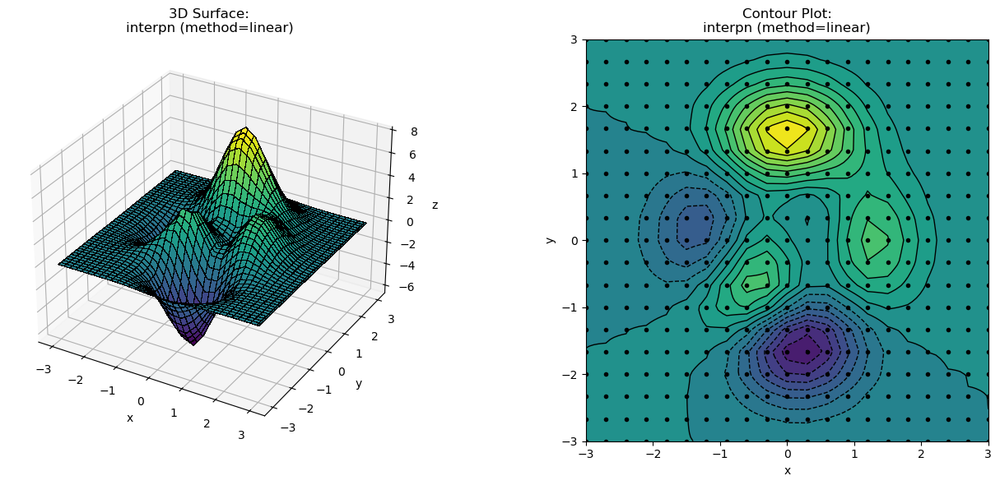

In [2]:
# Create the points for interpolation on the fine grid
points_fine = (x_fine, y_fine)

# Perform linear interpolation using interpn
z_interpn_linear = interpn((x_coarse, y_coarse), z_coarse, (xx_fine, yy_fine), method='linear')

# Plot the results
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_3d(ax, xx_fine, yy_fine, z_interpn_linear, "interpn (method=linear)")

ax = fig.add_subplot(1, 2, 2)
plot_2d_contour(ax, xx_fine, yy_fine, z_interpn_linear, "interpn (method=linear)")

plt.tight_layout()
plt.show()

As you can see, the surface has sharp creases along the grid lines, which is characteristic of linear interpolation.

---

## 3. `scipy.interpolate.RegularGridInterpolator`

This class creates an *interpolation object*. This is highly efficient if you need to interpolate at many different points because the initial setup (e.g., computing spline coefficients) is done only once.

### 3.1 `RegularGridInterpolator` with Various Methods

We'll test several methods available for this class:

* **Nearest:** Simply returns the value of the nearest grid point. It's very fast but produces a blocky, discontinuous surface.
* **Linear:** The same as with `interpn`. Provides a continuous but not smooth surface.
* **Cubic:** Uses cubic splines for a smoother ($C^2$ continuous) result.
* **Quintic:** Uses quintic splines for an even smoother ($C^4$ continuous) result.
* **pchip:** Piecewise Cubic Hermite Interpolating Polynomial. It preserves the shape of the data and avoids overshooting, which can be useful for data with sharp gradients. It is $C^1$ continuous.

In [3]:
# Create the points to evaluate on the fine grid
points_to_evaluate = np.transpose([xx_fine.ravel(), yy_fine.ravel()])

# A dictionary to store results from different methods
results_rgi = {}

# Loop through the methods
methods = ['nearest', 'linear', 'cubic', 'quintic', 'pchip']
for method in methods:
    # Create the interpolator object
    interpolator = RegularGridInterpolator((x_coarse, y_coarse), z_coarse, method=method)

    # Evaluate on the fine grid
    z_interp = interpolator(points_to_evaluate).reshape(xx_fine.shape)
    results_rgi[method] = z_interp

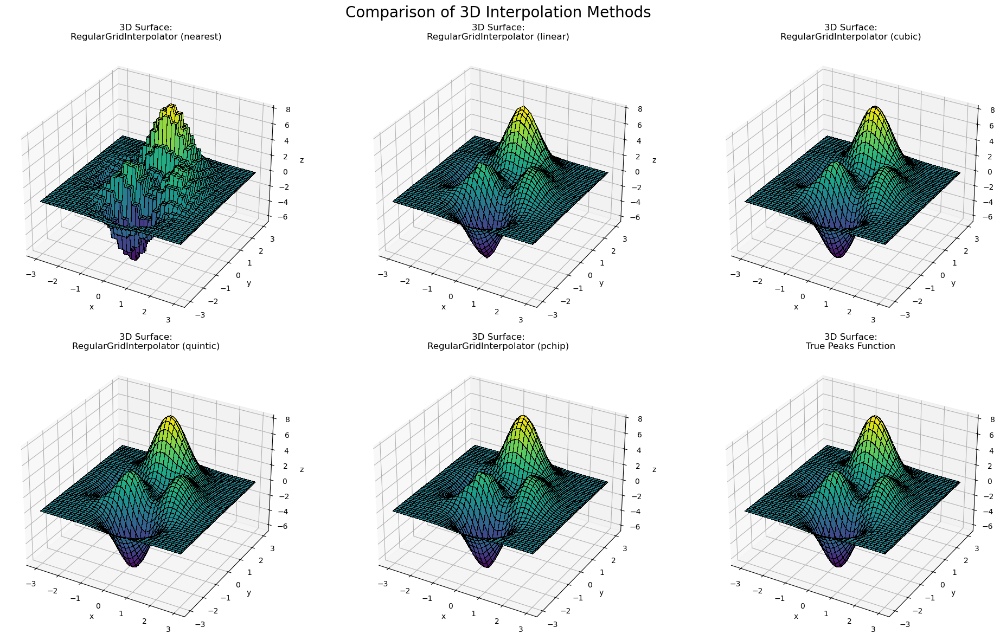

In [4]:
# Plot the results for each method
# Create the 3D comparison plot
fig_3d = plt.figure(figsize=(20, 12))
fig_3d.suptitle('Comparison of 3D Interpolation Methods', fontsize=20)

i = 0
for method, z_interp in results_rgi.items():
    ax = fig_3d.add_subplot(2, 3, i + 1, projection='3d')
    plot_3d(ax, xx_fine, yy_fine, z_interp, f"RegularGridInterpolator ({method})")
    i += 1

ax = fig_3d.add_subplot(2, 3, i + 1, projection='3d')
plot_3d(ax, xx_fine, yy_fine, z_true, "True Peaks Function")

plt.tight_layout()
plt.show()

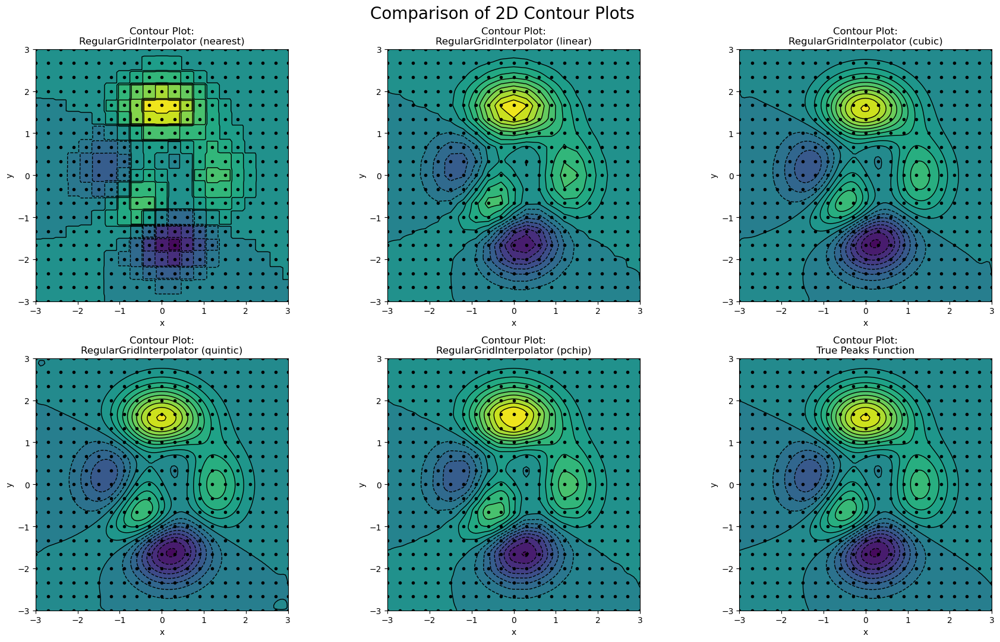

In [5]:
# Plot the results for each method
# Create the 3D comparison plot
fig_2d, axes_2d = plt.subplots(2, 3, figsize=(18, 11))
fig_2d.suptitle('Comparison of 2D Contour Plots', fontsize=20)
axes_flat = axes_2d.flatten()

i = 0
for method, z_interp in results_rgi.items():
    ax = axes_flat[i]
    plot_2d_contour(ax, xx_fine, yy_fine, z_interp, f"RegularGridInterpolator ({method})")
    i += 1

ax = axes_flat[i]
plot_2d_contour(ax, xx_fine, yy_fine, z_true, "True Peaks Function")

plt.tight_layout()
plt.show()

Observe the differences: 'nearest' is blocky, 'linear' is piecewise planar (the surface has sharp creases along the grid lines, which is characteristic of linear interpolation), and the spline-based methods ('cubic', 'quintic') produce much smoother surfaces that more closely resemble the true function. 'pchip' provides a good balance, avoiding the occasional "wiggles" that splines can introduce.

---

## 4. `scipy.interpolate.RectBivariateSpline`

This class is specifically designed for bivariate (2D) spline interpolation on a rectangular mesh. It's a powerful wrapper around the underlying FITPACK routines from FORTRAN. By default, it uses cubic splines ($k=3$).

A bivariate spline is a piecewise polynomial function of two variables. The interpolant $S(x, y)$ is constructed from a basis of B-splines:
$$S(x, y) = \sum_{i=0}^{m-1} \sum_{j=0}^{n-1} c_{ij} B_i(x) B_j(y)$$
where $B_i(x)$ and $B_j(y)$ are B-spline basis functions, and the coefficients $c_{ij}$ are determined by enforcing the interpolation conditions.

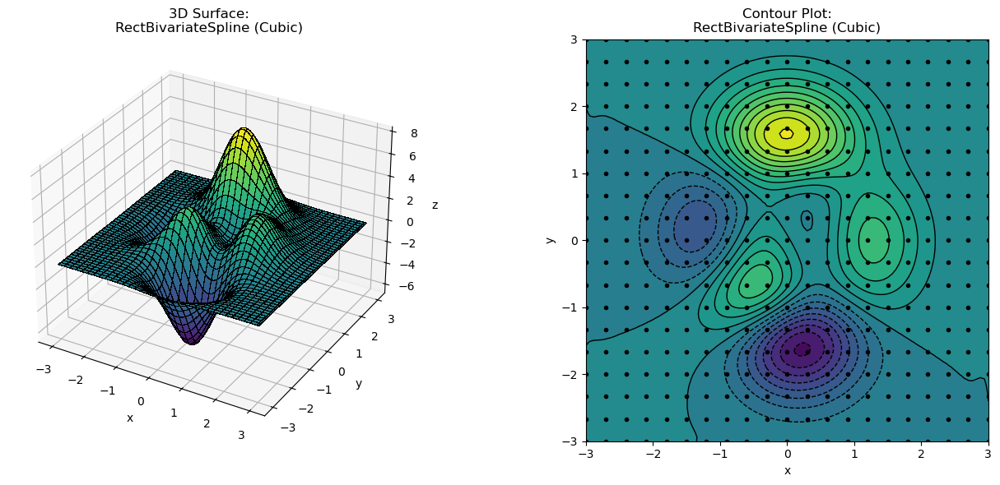

In [6]:
# Create the RectBivariateSpline interpolator object
# kx=3, ky=3 specifies a cubic spline in both x and y directions
spline_interpolator = RectBivariateSpline(x_coarse, y_coarse, z_coarse, kx=3, ky=3)

# Evaluate the spline on the fine grid
z_spline = spline_interpolator(x_fine, y_fine)

# Plot the results
fig = plt.figure(figsize=(14, 6))
ax = fig.add_subplot(1, 2, 1, projection='3d')
plot_3d(ax, xx_fine, yy_fine, z_spline, "RectBivariateSpline (Cubic)")

ax = fig.add_subplot(1, 2, 2)
plot_2d_contour(ax, xx_fine, yy_fine, z_spline, "RectBivariateSpline (Cubic)")

plt.tight_layout()
plt.show()

The result from `RectBivariateSpline` is very smooth and provides an excellent approximation of the true function, comparable to the 'cubic' method from `RegularGridInterpolator`.

---

## 5. Conclusion & Recommendations

We have explored three powerful tools in SciPy for interpolating data on structured grids. Here's a summary:

| Function/Class                | Key Characteristics                                                                                             | Best For                                                                                                      |
| ----------------------------- | --------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------- |
| **`interpn`** | A direct, "one-shot" function. Simple to use for quick interpolations.                                          | Quick, non-repetitive interpolation tasks.                                                                    |
| **`RegularGridInterpolator`** | An object-oriented approach. Highly efficient for repeated evaluations. Supports various interpolation methods. | When you need to query many points from the same dataset. Offers flexibility from nearest-neighbor to quintic splines. |
| **`RectBivariateSpline`** | A specialized class for 2D spline interpolation. Provides fine-grained control over spline degree.              | High-quality, smooth surface fitting in 2D applications where spline interpolation is specifically required.  |

For most engineering applications requiring a balance of speed, accuracy, and smoothness, **`RegularGridInterpolator` with the `'cubic'` or `'pchip'` method** is an excellent choice. If you need to perform many interpolations on the same dataset, creating the interpolator object once is the most efficient workflow. For the highest quality smoothness, `'quintic'` splines can be used, at a slightly higher computational cost. `RectBivariateSpline` remains a robust and excellent choice specifically for 2D spline fitting.

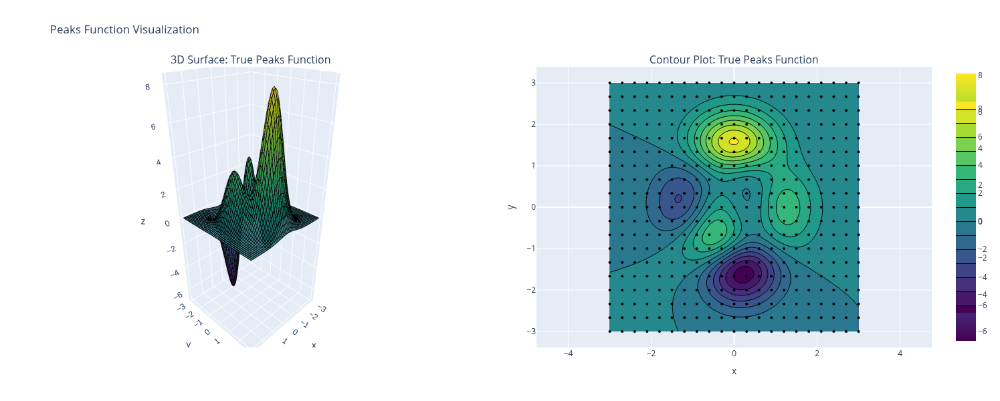

In [7]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define the peaks function
def peaks(x, y):
    return 3*(1 - x)**2 * np.exp(-(x**2) - (y + 1)**2) \
           - 10*(x/5 - x**3 - y**5)*np.exp(-x**2 - y**2) \
           - np.exp(-(x + 1)**2 - y**2)/3

# Create the coarse grid (our "known" data)
x_coarse = np.linspace(-3, 3, 21)
y_coarse = np.linspace(-3, 3, 19)
xx_coarse, yy_coarse = np.meshgrid(x_coarse, y_coarse, indexing='ij')
z_coarse = peaks(xx_coarse, yy_coarse)

# Create the fine grid for interpolation and plotting the "true" surface
x_fine = np.linspace(-3, 3, 101)
y_fine = np.linspace(-3, 3, 99)
xx_fine, yy_fine = np.meshgrid(x_fine, y_fine, indexing='xy')  # Changed to 'xy' indexing
z_true = peaks(xx_fine, yy_fine)

# Function to create 3D plot
def plot_3d(x, y, z, title, show_samples=False):
    """
    A helper function to generate a detailed 3D plot.
    Returns a list of traces for the 3D plot.
    """
    traces = []
    
    # Add surface without wireframe first
    surface = go.Surface(
        x=x,
        y=y,
        z=z,
        colorscale='viridis',
        showscale=True,
        opacity=0.9,
        name=title
    )
    traces.append(surface)
    
    # Add wireframe lines manually
    # Sample every few points to avoid too many lines while keeping density
    step = max(1, min(x.shape[0]//40, x.shape[1]//40))  # Adjust density
    
    # Add horizontal wireframe lines (constant y)
    for i in range(0, x.shape[0], step):
        wireframe_x = go.Scatter3d(
            x=x[i, :],
            y=y[i, :],
            z=z[i, :],
            mode='lines',
            line=dict(color='black', width=2),
            showlegend=False,
            hoverinfo='skip'
        )
        traces.append(wireframe_x)
    
    # Add vertical wireframe lines (constant x)
    for j in range(0, x.shape[1], step):
        wireframe_y = go.Scatter3d(
            x=x[:, j],
            y=y[:, j],
            z=z[:, j],
            mode='lines',
            line=dict(color='black', width=2),
            showlegend=False,
            hoverinfo='skip'
        )
        traces.append(wireframe_y)
    
    # Add sample points if requested
    if show_samples:
        scatter_3d = go.Scatter3d(
            x=xx_coarse.flatten(),
            y=yy_coarse.flatten(),
            z=z_coarse.flatten(),
            mode='markers',
            marker=dict(size=3, color='black'),
            name='Sample Points',
            showlegend=False
        )
        traces.append(scatter_3d)
    
    return traces

def plot_2d_contour(x, y, z, title, show_samples=True):
    """
    A helper function to generate a 2D contour plot.
    Returns a list of traces for the 2D contour plot.
    """
    traces = []
    
    # Ensure we have the right data format for Plotly contour
    if x.ndim == 2 and y.ndim == 2:
        # Extract 1D arrays from meshgrid
        x_1d = x[0, :]  # First row for x values
        y_1d = y[:, 0]  # First column for y values
    else:
        x_1d = x
        y_1d = y
    
    # Try different orientations to see which works
    # Plotly expects z[i][j] to correspond to x[j], y[i]
    z_oriented = z
    
    # Add filled contour plot
    contour = go.Contour(
        x=x_1d,
        y=y_1d,
        z=z_oriented,
        colorscale='viridis',
        showscale=True,
        colorbar=dict(x=1.02, len=0.8),
        contours=dict(
            showlines=True,
            coloring='fill'
        ),
        line=dict(
            color='black',
            width=1
        ),
        ncontours=20,
        name=title
    )
    traces.append(contour)
    
    # Add sample points if requested
    if show_samples:
        scatter_2d = go.Scatter(
            x=xx_coarse.flatten(),
            y=yy_coarse.flatten(),
            mode='markers',
            marker=dict(size=4, color='black'),
            name='Sample Points',
            showlegend=False
        )
        traces.append(scatter_2d)
    
    return traces

# Create the plots using the helper functions
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("3D Surface: True Peaks Function", "Contour Plot: True Peaks Function"),
    specs=[[{"type": "surface"}, {"type": "xy"}]],
    horizontal_spacing=0.1
)

# Add 3D surface plot traces
traces_3d = plot_3d(xx_fine, yy_fine, z_true, "True Peaks Function")
for trace in traces_3d:
    fig.add_trace(trace, row=1, col=1)

# Add 2D contour plot traces
traces_2d = plot_2d_contour(xx_fine, yy_fine, z_true, "True Peaks Function", show_samples=True)
for trace in traces_2d:
    fig.add_trace(trace, row=1, col=2)

# Update layout
fig.update_layout(
    title="Peaks Function Visualization",
    width=1200,
    height=600,
    showlegend=False
)

# Update 3D scene
fig.update_scenes(
    xaxis_title="x",
    yaxis_title="y",
    zaxis_title="z",
    camera=dict(
        eye=dict(x=1.5, y=1.5, z=1.2)  # Equivalent to elev=30, azim=-60
    )
)

# Update 2D subplot
fig.update_xaxes(title_text="x", row=1, col=2)
fig.update_yaxes(title_text="y", scaleanchor="x", scaleratio=1, row=1, col=2)

# Show the plot
fig.show()